In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import scipy
import statsmodels.api as sm

In [19]:
performance_metrics = pd.read_excel('Cleaned Dataset.xlsx', sheet_name='Ops People Data')
performance_metrics.info()
performance_metrics.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 240 entries, 0 to 239
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Period               240 non-null    object 
 1   Plant                240 non-null    object 
 2   Staffing %           240 non-null    float64
 3   Absenteeism %        240 non-null    float64
 4   Turnover %           240 non-null    float64
 5   Turnover 1st Year %  240 non-null    float64
 6   Tenure <2 %          240 non-null    float64
 7   Tenure >10 %         240 non-null    float64
 8   Efficiency %         240 non-null    float64
 9   Spoilage %           240 non-null    float64
 10  TRIR safety          240 non-null    float64
 11  HFI quality          240 non-null    float64
dtypes: float64(10), object(2)
memory usage: 22.6+ KB


,Period,Plant,Staffing %,Absenteeism %,Turnover %,Turnover 1st Year %,Tenure <2 %,Tenure >10 %,Efficiency %,Spoilage %,TRIR safety,HFI quality
0,2022_01,Plant_01,-0.031250,0.0720,0.000,0.00,0.864,0.032,0.793,0.0171,0.0,0.0080
1,2022_02,Plant_01,-0.023438,0.0452,0.000,0.00,0.863,0.032,0.817,0.0151,0.0,0.0037
2,2022_03,Plant_01,0.015625,0.0456,0.000,0.00,0.852,0.031,0.816,0.1033,0.0,0.0032
3,2022_04,Plant_01,0.007812,0.0450,0.016,0.50,0.858,0.031,0.787,0.0243,0.0,0.0056
4,2022_05,Plant_01,-0.015625,0.0648,0.032,0.75,0.864,0.024,0.816,0.0305,0.0,0.0152


In [20]:
# Loop through columns and multiply numeric values by 100
for col in performance_metrics.columns:
    if pd.api.types.is_numeric_dtype(performance_metrics[col]):
        performance_metrics[col] *= 100

performance_metrics.head()

,Period,Plant,Staffing %,Absenteeism %,Turnover %,Turnover 1st Year %,Tenure <2 %,Tenure >10 %,Efficiency %,Spoilage %,TRIR safety,HFI quality
0,2022_01,Plant_01,-3.12500,7.20,0.0,0.0,86.4,3.2,79.3,1.71,0.0,0.80
1,2022_02,Plant_01,-2.34375,4.52,0.0,0.0,86.3,3.2,81.7,1.51,0.0,0.37
2,2022_03,Plant_01,1.56250,4.56,0.0,0.0,85.2,3.1,81.6,10.33,0.0,0.32
3,2022_04,Plant_01,0.78125,4.50,1.6,50.0,85.8,3.1,78.7,2.43,0.0,0.56
4,2022_05,Plant_01,-1.56250,6.48,3.2,75.0,86.4,2.4,81.6,3.05,0.0,1.52


In [21]:
performance_metrics.describe()

,Staffing %,Absenteeism %,Turnover %,Turnover 1st Year %,Tenure <2 %,Tenure >10 %,Efficiency %,Spoilage %,TRIR safety,HFI quality
count,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000
mean,-4.437360,6.031889,1.440417,31.410833,36.890000,28.708750,75.632423,5.197015,224.665417,1.708627
std,4.140771,2.595746,1.060350,32.760380,23.301261,15.659552,8.233212,2.546858,204.277277,1.616023
min,-18.892508,1.250000,0.000000,0.000000,12.000000,2.100000,45.920000,0.230000,0.000000,-3.590000
25%,-6.403945,4.127500,0.700000,0.000000,23.300000,22.025000,70.450000,3.677500,0.000000,0.882500
50%,-3.688525,5.595000,1.300000,25.850000,29.450000,32.000000,76.535000,4.840000,233.000000,1.455000
75%,-1.418651,7.400000,2.000000,50.000000,34.900000,39.850000,80.500000,6.562827,335.250000,2.420000
max,3.954342,15.820000,6.200000,100.000000,95.300000,59.700000,95.500000,19.390000,1147.000000,13.130000


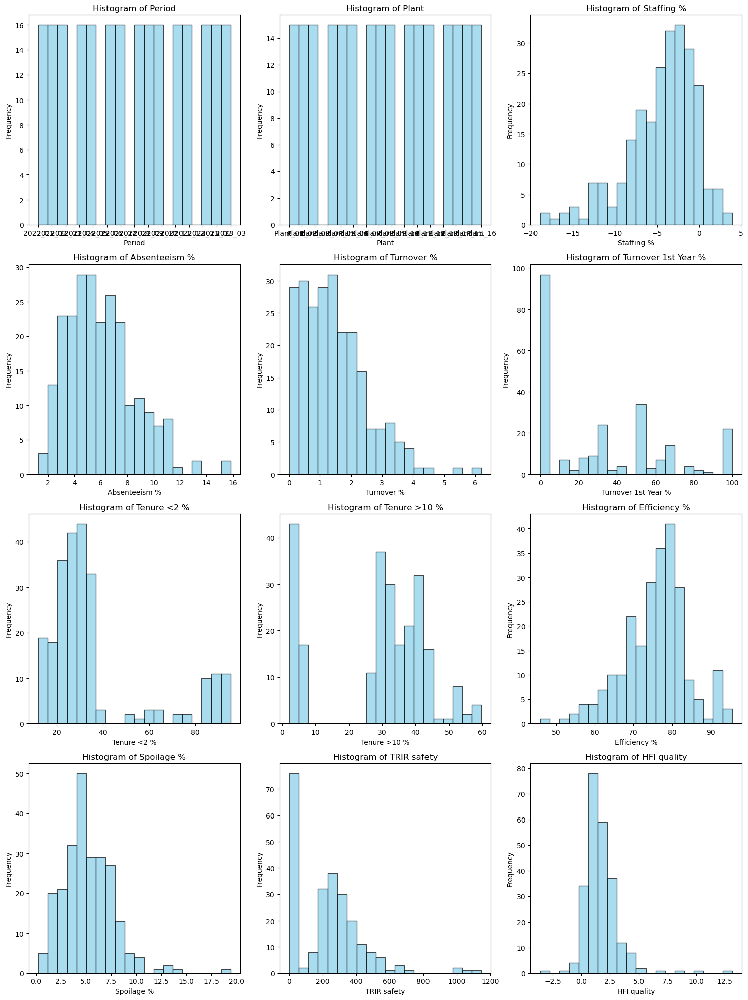

In [22]:
numeric_variables = performance_metrics.columns.tolist()

num_plots = len(numeric_variables)
num_rows = (num_plots + 2) // 3
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

for i, var in enumerate(numeric_variables):
    row = i // 3
    col = i % 3

    axes[row, col].hist(performance_metrics[var], bins=20, color='skyblue', edgecolor='black', alpha=0.7)
    axes[row, col].set_title(f"Histogram of {var}")
    axes[row, col].set_xlabel(var)
    axes[row, col].set_ylabel("Frequency")

if num_plots % 3 != 0:
    for ax in axes.flatten()[num_plots:]:
        ax.axis('off')

plt.tight_layout()
plt.show()

C:\Users\joel3\AppData\Local\Temp\ipykernel_11272\4197124012.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = performance_metrics.corr()


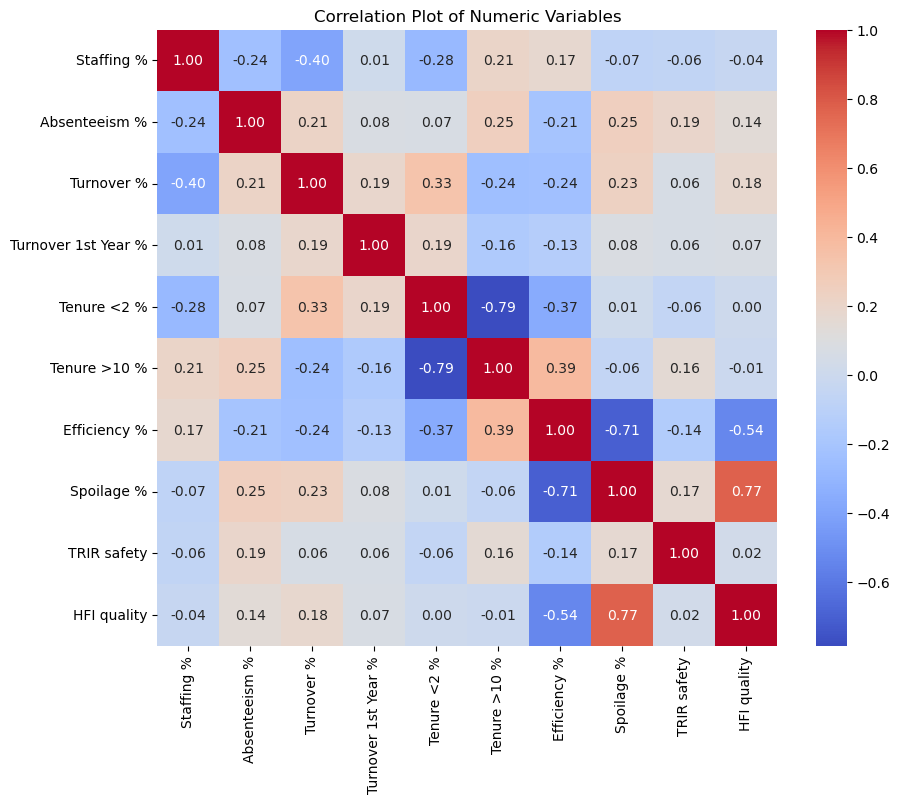

In [23]:
# Compute the correlation matrix
correlation_matrix = performance_metrics.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Plot of Numeric Variables')
plt.show()

In [24]:
performance_metrics['Period'] = pd.to_datetime(performance_metrics['Period'], format='%Y_%m')

# Define the columns to shift and the column to exclude ('Efficiency %')
columns_to_shift = ['Staffing %', 'Absenteeism %', 'Turnover %', 'Turnover 1st Year %',
                    'Tenure <2 %', 'Tenure >10 %', 'Spoilage %', 'TRIR safety', 'HFI quality']


shifted_performance_metrics = performance_metrics.copy()

# Iterate over unique plants and shift values within each group
for plant in shifted_performance_metrics['Plant'].unique():
    mask = shifted_performance_metrics['Plant'] == plant
    for col in columns_to_shift:
        shifted_performance_metrics.loc[mask, col] = shifted_performance_metrics.loc[mask, col].shift(periods=1)

shifted_performance_metrics.head(20)

,Period,Plant,Staffing %,Absenteeism %,Turnover %,Turnover 1st Year %,Tenure <2 %,Tenure >10 %,Efficiency %,Spoilage %,TRIR safety,HFI quality
0,2022-01-01,Plant_01,NaN,NaN,NaN,NaN,NaN,NaN,79.30,NaN,NaN,NaN
1,2022-02-01,Plant_01,-3.125000,7.20,0.0,0.0,86.4,3.2,81.70,1.71,0.0,0.80
2,2022-03-01,Plant_01,-2.343750,4.52,0.0,0.0,86.3,3.2,81.60,1.51,0.0,0.37
3,2022-04-01,Plant_01,1.562500,4.56,0.0,0.0,85.2,3.1,78.70,10.33,0.0,0.32
4,2022-05-01,Plant_01,0.781250,4.50,1.6,50.0,85.8,3.1,81.60,2.43,0.0,0.56
5,2022-06-01,Plant_01,-1.562500,6.48,3.2,75.0,86.4,2.4,80.10,3.05,0.0,1.52
6,2022-07-01,Plant_01,-3.053435,3.50,2.4,0.0,86.4,2.4,78.40,3.52,0.0,0.72
7,2022-08-01,Plant_01,0.000000,2.31,0.8,100.0,87.1,2.3,69.20,5.38,0.0,3.76
8,2022-09-01,Plant_01,-13.725490,7.67,3.1,50.0,86.7,2.3,73.70,0.23,0.0,2.44
9,2022-10-01,Plant_01,-15.686275,5.02,2.4,33.3,87.3,2.4,73.10,1.36,0.0,2.09


C:\Users\joel3\AppData\Local\Temp\ipykernel_11272\2168778633.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = shifted_performance_metrics_cleaned.corr()


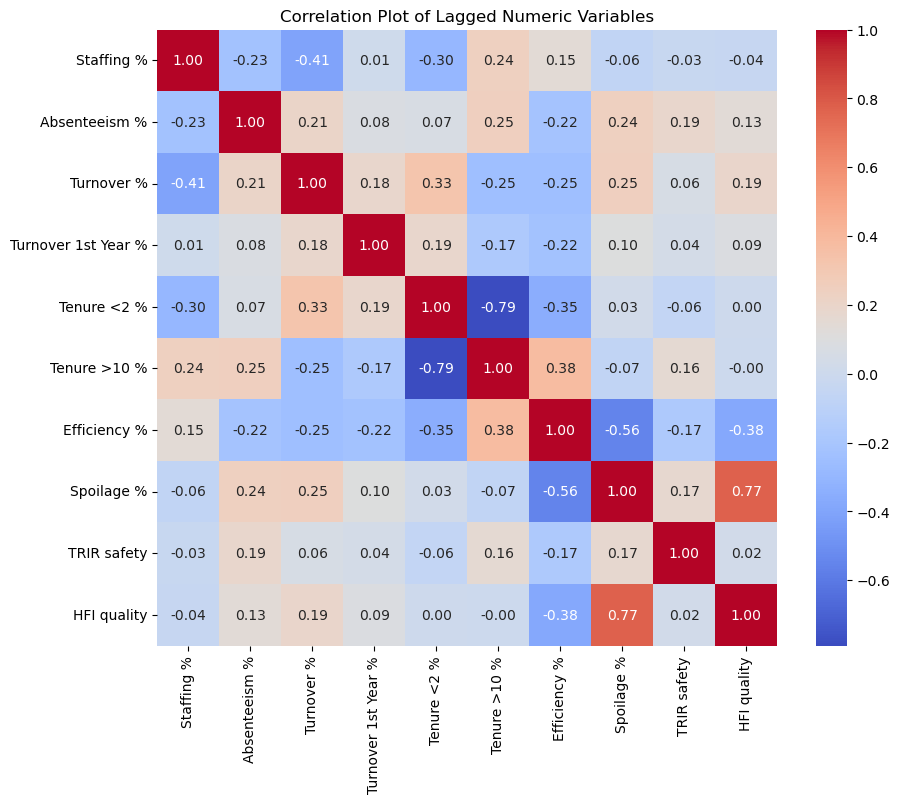

In [25]:
shifted_performance_metrics_cleaned = shifted_performance_metrics.dropna()

# Create a correlation matrix
correlation_matrix = shifted_performance_metrics_cleaned.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Plot of Lagged Numeric Variables')
plt.show()

In [26]:
performance_metrics_cleaned = performance_metrics.dropna()

X = performance_metrics_cleaned[['HFI quality']]
y = performance_metrics_cleaned['Efficiency %']

# Add a constant to the independent variables matrix
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the regression results
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           Efficiency %   R-squared:                       0.289
Model:                            OLS   Adj. R-squared:                  0.286
Method:                 Least Squares   F-statistic:                     96.73
Date:                Wed, 03 Apr 2024   Prob (F-statistic):           2.25e-19
Time:                        17:53:06   Log-Likelihood:                -805.08
No. Observations:                 240   AIC:                             1614.
Df Residuals:                     238   BIC:                             1621.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          80.3120      0.654    122.754      

In [27]:
# Drop rows with null values
performance_metrics_cleaned = performance_metrics.dropna()

# Convert 'Plant' column into dummy variables
X_plant = pd.get_dummies(performance_metrics_cleaned['Plant'], drop_first=True)

# Combine the dummy variables with other independent variables
X = pd.concat([performance_metrics_cleaned[['Spoilage %']], X_plant], axis=1)

# Define the dependent variable (y)
y = performance_metrics_cleaned['Efficiency %']

# Add a constant to the independent variables matrix
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           Efficiency %   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     58.92
Date:                Wed, 03 Apr 2024   Prob (F-statistic):           1.02e-70
Time:                        17:53:07   Log-Likelihood:                -647.54
No. Observations:                 240   AIC:                             1329.
Df Residuals:                     223   BIC:                             1388.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         82.7441      1.018     81.281      0.0

In [28]:
import statsmodels.formula.api as smf

new_columns = {col: col.replace(' ', '').replace('%', '') for col in performance_metrics.columns}
performance_metrics.rename(columns=new_columns, inplace=True)
reg = smf.ols('Efficiency ~ C(Plant) + Spoilage', data=performance_metrics).fit()
print(reg.summary())

                            OLS Regression Results                            
Dep. Variable:             Efficiency   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     58.92
Date:                Wed, 03 Apr 2024   Prob (F-statistic):           1.02e-70
Time:                        17:53:07   Log-Likelihood:                -647.54
No. Observations:                 240   AIC:                             1329.
Df Residuals:                     223   BIC:                             1388.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               82.7441 

KeyError: 'Efficiency %'

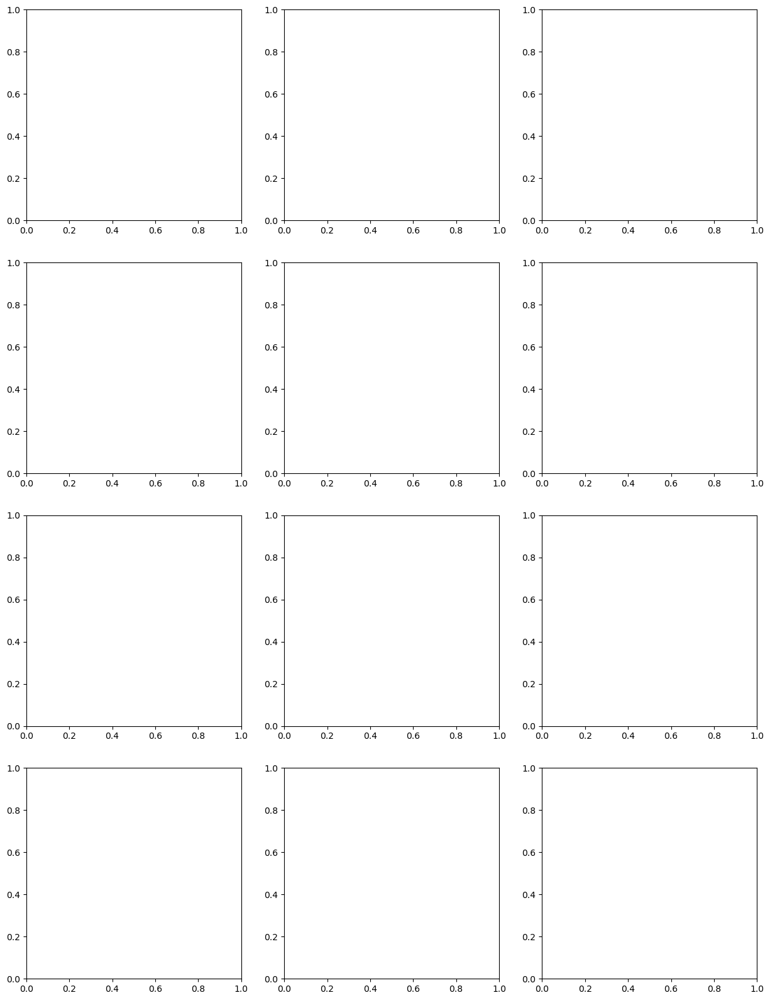

In [29]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

numeric_variables = [col for col in performance_metrics.columns if performance_metrics[col].dtype in ['int64', 'float64']]
num_plots = len(numeric_variables)
num_rows = (num_plots + 2) // 3
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

for i, var in enumerate(numeric_variables):
    row = i // 3
    col = i % 3

    lower_cutoff = performance_metrics[var].quantile(0.05)
    upper_cutoff = performance_metrics[var].quantile(0.95)
    trimmed_data = performance_metrics[(performance_metrics[var] >= lower_cutoff) & (performance_metrics[var] <= upper_cutoff)]

    x = trimmed_data[var].values.reshape(-1, 1)
    y = trimmed_data['Efficiency'].values

    model = LinearRegression()
    model.fit(x, y)
    trendline = model.predict(x)

    r_squared = r2_score(y, trendline)

    axes[row, col].scatter(trimmed_data[var], trimmed_data['Efficiency'], alpha=0.5)
    axes[row, col].plot(trimmed_data[var], trendline, color='red', linewidth=2, label='Trend line')

    equation = f'y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}'
    axes[row, col].text(0.05, 0.95, equation, transform=axes[row, col].transAxes, fontsize=10)
    axes[row, col].text(0.05, 0.95, f'R-squared: {r_squared:.2f}', transform=axes[row, col].transAxes, fontsize=10)

    axes[row, col].set_title(f"Efficiency vs {var}")
    axes[row, col].set_xlabel(var)
    axes[row, col].set_ylabel("Efficiency")
    axes[row, col].grid(True)
    axes[row, col].legend()

    if num_plots % 3 != 0 and row == num_rows - 1:
        axes[row, col + 1].axis('off')

plt.tight_layout()
plt.show()

# Trimmed the bottom and upper 5% 

In [33]:
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd

features = ['Plant', 'Staffing', 'Absenteeism', 'Turnover',
            'Turnover1stYear', 'Tenure<2', 'Tenure>10']
X = performance_metrics[features]
y = performance_metrics['Efficiency']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

encoder = OneHotEncoder(handle_unknown='ignore')

numerical_cols = ['Staffing', 'Absenteeism', 'Turnover', 'Turnover1stYear',
                  'Tenure<2', 'Tenure>10']
categorical_cols = ['Plant']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols), 
        ('cat', encoder, categorical_cols)          
    ],
    remainder='passthrough'
)

rf_regressor = RandomForestRegressor()

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', rf_regressor)])

param_dist = {
    'regressor__n_estimators': [50, 100, 250],
    'regressor__max_depth': [None, 10, 20, 30, 50, 100],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 3, 5, 10],
    'regressor__max_features': ['auto', 'sqrt', 'log2']
}

random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', random_state=42)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

C:\Users\joel3\anaconda\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
150 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
150 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\pipeline.py", line 420, in fit
    self._final_estimator.fit(

Best Parameters: {'regressor__n_estimators': 100, 'regressor__min_samples_split': 5, 'regressor__min_samples_leaf': 1, 'regressor__max_features': 'sqrt', 'regressor__max_depth': None}
Mean Squared Error: 21.31376952717481


In [34]:
performance_metrics.columns

Index(['Period', 'Plant', 'Staffing', 'Absenteeism', 'Turnover',
       'Turnover1stYear', 'Tenure<2', 'Tenure>10', 'Efficiency', 'Spoilage',
       'TRIRsafety', 'HFIquality'],
      dtype='object')

In [35]:
importances = best_model.named_steps['regressor'].feature_importances_

encoded_cat_names = best_model.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(input_features=categorical_cols)
feature_names = numerical_cols + list(encoded_cat_names)

feature_importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importances_df)

Feature Importances:
            Feature  Importance
5         Tenure>10    0.210610
4          Tenure<2    0.172559
10   Plant_Plant_05    0.113437
1       Absenteeism    0.106314
11   Plant_Plant_06    0.087753
0          Staffing    0.062760
2          Turnover    0.049539
3   Turnover1stYear    0.035111
12   Plant_Plant_07    0.027928
18   Plant_Plant_13    0.018165
16   Plant_Plant_11    0.018044
6    Plant_Plant_01    0.014223
19   Plant_Plant_14    0.013449
13   Plant_Plant_08    0.011088
9    Plant_Plant_04    0.010432
15   Plant_Plant_10    0.010186
20   Plant_Plant_15    0.009993
17   Plant_Plant_12    0.009367
21   Plant_Plant_16    0.005195
7    Plant_Plant_02    0.004794
14   Plant_Plant_09    0.004631
8    Plant_Plant_03    0.004420


In [ ]:
cv_results = pd.DataFrame(random_search.cv_results_)
sns.lineplot(x='param_regressor__n_estimators', y='mean_test_score', data=cv_results)
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Squared Error (Negative)')
plt.title('Mean Squared Error vs. Number of Estimators')
plt.show()

In [ ]:
from sklearn.tree import plot_tree

single_tree = best_model.named_steps['regressor'].estimators_[0]

plt.figure(figsize=(150,150))
plot_tree(single_tree, feature_names=feature_names, filled=True, rounded=True)
plt.show()


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

numeric_variables = [col for col in performance_metrics.columns if performance_metrics[col].dtype in ['int64', 'float64']]
num_plots = len(numeric_variables)
num_rows = (num_plots + 2) // 3
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

for i, var in enumerate(numeric_variables):
    row = i // 3
    col = i % 3

    lower_cutoff = performance_metrics[var].quantile(0.05)
    upper_cutoff = performance_metrics[var].quantile(0.95)
    trimmed_data = performance_metrics[(performance_metrics[var] >= lower_cutoff) & (performance_metrics[var] <= upper_cutoff)]

    x = trimmed_data[var].values.reshape(-1, 1)
    y = trimmed_data['Spoilage %'].values

    model = LinearRegression()
    model.fit(x, y)
    trendline = model.predict(x)

    r_squared = r2_score(y, trendline)

    axes[row, col].scatter(trimmed_data[var], trimmed_data['Spoilage %'], alpha=0.5)
    axes[row, col].plot(trimmed_data[var], trendline, color='red', linewidth=2, label='Trend line')

    equation = f'y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}'
    axes[row, col].text(0.1, 0.9, equation, transform=axes[row, col].transAxes, fontsize=10)
    axes[row, col].text(0.1, 0.8, f'R-squared: {r_squared:.2f}', transform=axes[row, col].transAxes, fontsize=10)

    axes[row, col].set_title(f"Spoilage vs {var}")
    axes[row, col].set_xlabel(var)
    axes[row, col].set_ylabel("Spoilage %")
    axes[row, col].grid(True)
    axes[row, col].legend()

    if num_plots % 3 != 0 and row == num_rows - 1:
        axes[row, col + 1].axis('off')

plt.tight_layout()
plt.show()

# Trimmed the bottom and upper 5% 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import seaborn as sns

features = ['Plant', 'Staffing %', 'Absenteeism %', 'Turnover %',
            'Turnover 1st Year %', 'Tenure <2 %', 'Tenure >10 %']
X = performance_metrics[features]
y = performance_metrics['Spoilage %']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

encoder = OneHotEncoder(handle_unknown='ignore')
encoder.fit(X_train[['Plant']])  

numerical_cols = ['Staffing %', 'Absenteeism %', 'Turnover %', 'Turnover 1st Year %',
                  'Tenure <2 %', 'Tenure >10 %', 'TRIR safety', 'HFI quality']
categorical_cols = ['Plant']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols), 
        ('cat', encoder, categorical_cols)          
    ],
    remainder='passthrough'
)

rf_regressor = RandomForestRegressor()

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', rf_regressor)])

param_dist = {
    'regressor__n_estimators': [50, 100, 250],
    'regressor__max_depth': [None, 10, 20, 30, 50, 100],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 3, 5, 10],
    'regressor__max_features': ['auto', 'sqrt', 'log2']
}

random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', random_state=42)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

importances = best_model.named_steps['regressor'].feature_importances_
feature_names = numerical_cols + list(encoder.get_feature_names_out())
feature_importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importances_df)

cv_results = pd.DataFrame(random_search.cv_results_)
sns.lineplot(x='param_regressor__n_estimators', y='mean_test_score', data=cv_results)
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Squared Error (Negative)')
plt.title('Mean Squared Error vs. Number of Estimators')
plt.show()

NameError: name 'performance_metrics' is not defined

In [81]:
single_tree = best_model.named_steps['regressor'].estimators_[0]
plt.figure(figsize=(110,150))
plot_tree(single_tree, feature_names=feature_names, filled=True, rounded=True)
plt.show()

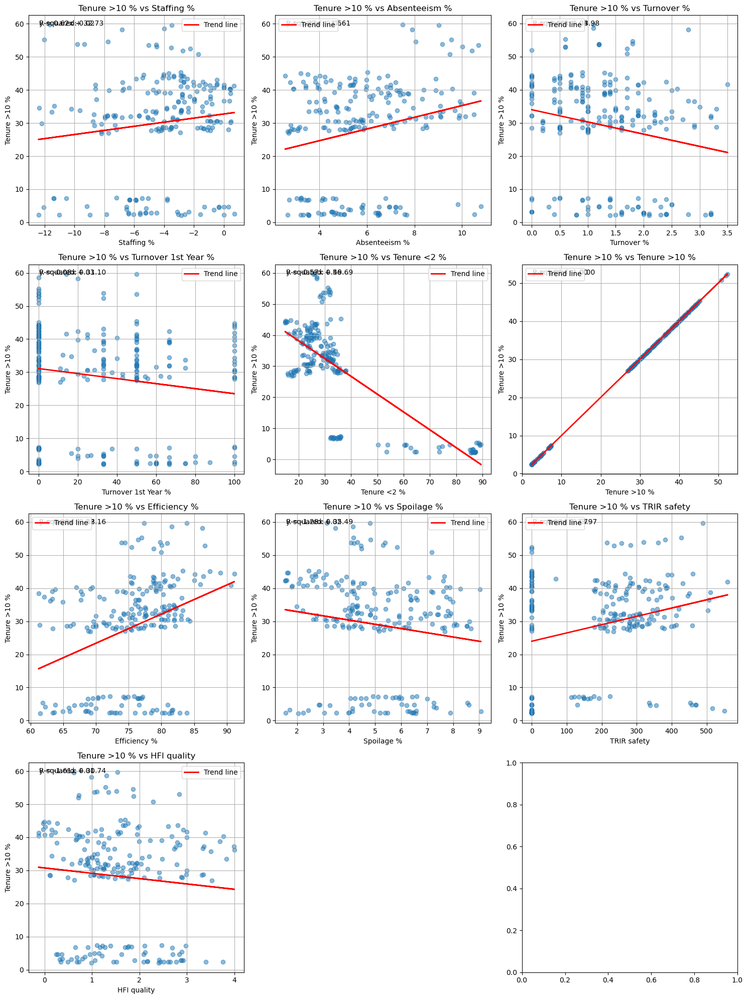

In [85]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

numeric_variables = [col for col in performance_metrics.columns if performance_metrics[col].dtype in ['int64', 'float64']]
num_plots = len(numeric_variables)
num_rows = (num_plots + 2) // 3
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

for i, var in enumerate(numeric_variables):
    row = i // 3
    col = i % 3

    lower_cutoff = performance_metrics[var].quantile(0.05)
    upper_cutoff = performance_metrics[var].quantile(0.95)
    trimmed_data = performance_metrics[(performance_metrics[var] >= lower_cutoff) & (performance_metrics[var] <= upper_cutoff)]

    x = trimmed_data[var].values.reshape(-1, 1)
    y = trimmed_data['Tenure >10 %'].values

    model = LinearRegression()
    model.fit(x, y)
    trendline = model.predict(x)

    r_squared = r2_score(y, trendline)

    axes[row, col].scatter(trimmed_data[var], trimmed_data['Tenure >10 %'], alpha=0.5)
    axes[row, col].plot(trimmed_data[var], trendline, color='red', linewidth=2, label='Trend line')

    equation = f'y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}'
    axes[row, col].text(0.1, 0.9, equation, transform=axes[row, col].transAxes, fontsize=10)
    axes[row, col].text(0.1, 0.8, f'R-squared: {r_squared:.2f}', transform=axes[row, col].transAxes, fontsize=10)

    axes[row, col].set_title(f"Tenure >10 % vs {var}")
    axes[row, col].set_xlabel(var)
    axes[row, col].set_ylabel("Tenure >10 %")
    axes[row, col].grid(True)
    axes[row, col].legend()

    if num_plots % 3 != 0 and row == num_rows - 1:
        axes[row, col + 1].axis('off')

plt.tight_layout()
plt.show()

# Trimmed the bottom and upper 5% 

C:\Users\joel3\anaconda\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
150 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
150 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\pipeline.py", line 420, in fit
    self._final_estimator.fit(

Best Parameters: {'regressor__n_estimators': 100, 'regressor__min_samples_split': 2, 'regressor__min_samples_leaf': 1, 'regressor__max_features': 'log2', 'regressor__max_depth': 50}
Mean Squared Error: 17.172726499999985
Feature Importances:
                Feature  Importance
4           Tenure <2 %    0.307628
22       Plant_Plant_15    0.089081
8        Plant_Plant_01    0.072169
16       Plant_Plant_09    0.069808
1         Absenteeism %    0.058674
14       Plant_Plant_07    0.058055
2            Turnover %    0.053460
6           TRIR safety    0.052377
5            Spoilage %    0.047244
18       Plant_Plant_11    0.046603
0            Staffing %    0.039535
7           HFI quality    0.025651
3   Turnover 1st Year %    0.017113
12       Plant_Plant_05    0.011499
19       Plant_Plant_12    0.008763
17       Plant_Plant_10    0.006751
15       Plant_Plant_08    0.005629
11       Plant_Plant_04    0.005204
20       Plant_Plant_13    0.005101
21       Plant_Plant_14    0.005064
23

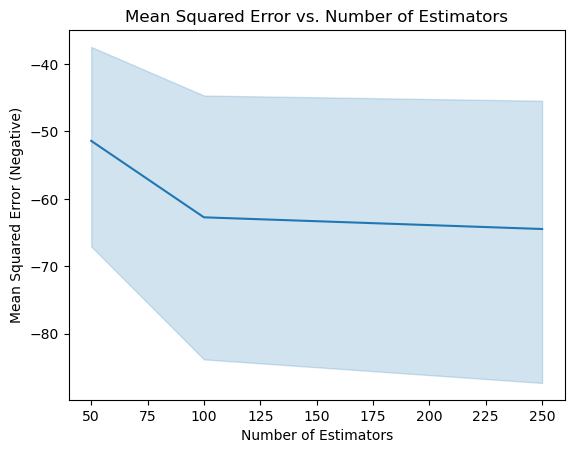

In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import seaborn as sns

features = ['Plant', 'Staffing %', 'Absenteeism %', 'Turnover %',
            'Turnover 1st Year %', 'Tenure <2 %', 'Spoilage %', 'TRIR safety', 'HFI quality']
X = performance_metrics[features]
y = performance_metrics['Tenure >10 %']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

encoder = OneHotEncoder(handle_unknown='ignore')
encoder.fit(X_train[['Plant']])  

numerical_cols = ['Staffing %', 'Absenteeism %', 'Turnover %', 'Turnover 1st Year %',
                  'Tenure <2 %', 'Spoilage %', 'TRIR safety', 'HFI quality']
categorical_cols = ['Plant']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols), 
        ('cat', encoder, categorical_cols)          
    ],
    remainder='passthrough'
)

rf_regressor = RandomForestRegressor()

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', rf_regressor)])

param_dist = {
    'regressor__n_estimators': [50, 100, 250],
    'regressor__max_depth': [None, 10, 20, 30, 50, 100],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 3, 5, 10],
    'regressor__max_features': ['auto', 'sqrt', 'log2']
}

random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', random_state=42)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

importances = best_model.named_steps['regressor'].feature_importances_
feature_names = numerical_cols + list(encoder.get_feature_names_out())
feature_importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importances_df)

cv_results = pd.DataFrame(random_search.cv_results_)
sns.lineplot(x='param_regressor__n_estimators', y='mean_test_score', data=cv_results)
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Squared Error (Negative)')
plt.title('Mean Squared Error vs. Number of Estimators')
plt.show()

In [88]:
single_tree = best_model.named_steps['regressor'].estimators_[0]
plt.figure(figsize=(110,150))
plot_tree(single_tree, feature_names=feature_names, filled=True, rounded=True)
plt.show()

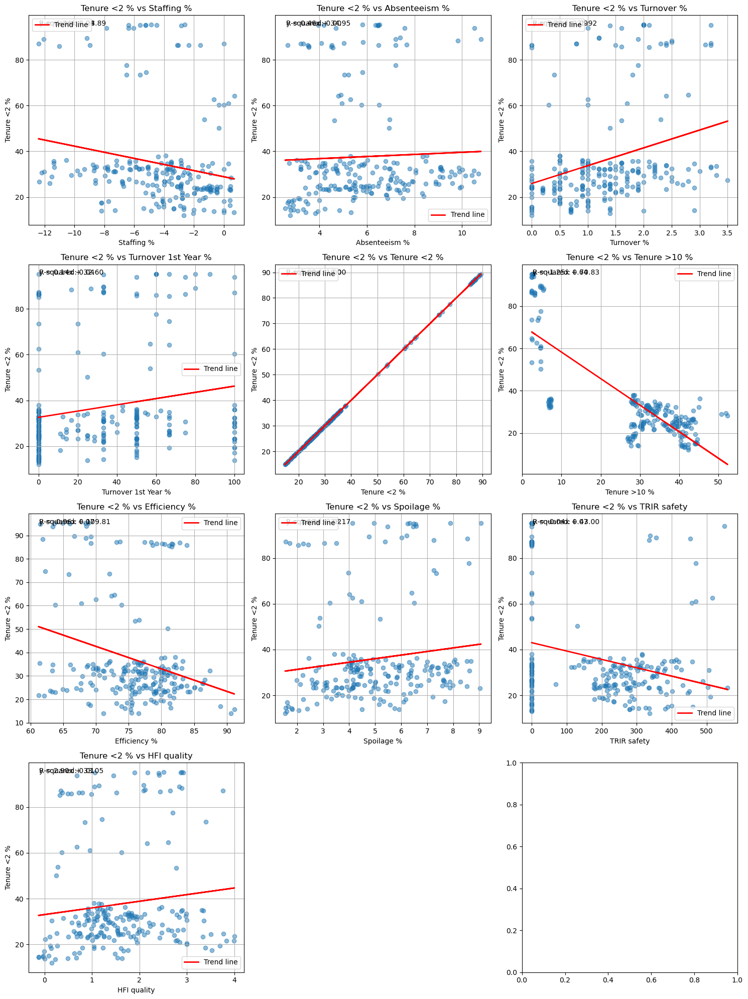

In [89]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

numeric_variables = [col for col in performance_metrics.columns if performance_metrics[col].dtype in ['int64', 'float64']]
num_plots = len(numeric_variables)
num_rows = (num_plots + 2) // 3
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

for i, var in enumerate(numeric_variables):
    row = i // 3
    col = i % 3

    lower_cutoff = performance_metrics[var].quantile(0.05)
    upper_cutoff = performance_metrics[var].quantile(0.95)
    trimmed_data = performance_metrics[(performance_metrics[var] >= lower_cutoff) & (performance_metrics[var] <= upper_cutoff)]

    x = trimmed_data[var].values.reshape(-1, 1)
    y = trimmed_data['Tenure <2 %'].values

    model = LinearRegression()
    model.fit(x, y)
    trendline = model.predict(x)

    r_squared = r2_score(y, trendline)

    axes[row, col].scatter(trimmed_data[var], trimmed_data['Tenure <2 %'], alpha=0.5)
    axes[row, col].plot(trimmed_data[var], trendline, color='red', linewidth=2, label='Trend line')

    equation = f'y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}'
    axes[row, col].text(0.1, 0.9, equation, transform=axes[row, col].transAxes, fontsize=10)
    axes[row, col].text(0.1, 0.8, f'R-squared: {r_squared:.2f}', transform=axes[row, col].transAxes, fontsize=10)

    axes[row, col].set_title(f"Tenure <2 % vs {var}")
    axes[row, col].set_xlabel(var)
    axes[row, col].set_ylabel("Tenure <2 %")
    axes[row, col].grid(True)
    axes[row, col].legend()

    if num_plots % 3 != 0 and row == num_rows - 1:
        axes[row, col + 1].axis('off')

plt.tight_layout()
plt.show()

# Trimmed the bottom and upper 5% 

C:\Users\joel3\anaconda\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
150 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
150 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\pipeline.py", line 420, in fit
    self._final_estimator.fit(

Best Parameters: {'regressor__n_estimators': 100, 'regressor__min_samples_split': 2, 'regressor__min_samples_leaf': 1, 'regressor__max_features': 'log2', 'regressor__max_depth': 20}
Mean Squared Error: 37.39707027970531
Feature Importances:
                Feature  Importance
4          Tenure >10 %    0.361669
8        Plant_Plant_01    0.130952
18       Plant_Plant_11    0.094512
14       Plant_Plant_07    0.068972
2            Turnover %    0.062505
0            Staffing %    0.061860
5            Spoilage %    0.051490
6           TRIR safety    0.043993
1         Absenteeism %    0.034136
3   Turnover 1st Year %    0.023997
7           HFI quality    0.021715
12       Plant_Plant_05    0.013602
9        Plant_Plant_02    0.007313
16       Plant_Plant_09    0.003967
13       Plant_Plant_06    0.002915
15       Plant_Plant_08    0.002822
20       Plant_Plant_13    0.002533
17       Plant_Plant_10    0.002241
19       Plant_Plant_12    0.001960
11       Plant_Plant_04    0.001911
10 

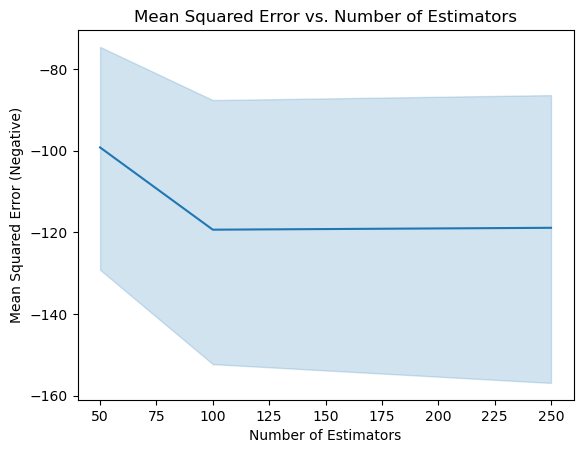

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import seaborn as sns

features = ['Plant', 'Staffing %', 'Absenteeism %', 'Turnover %',
            'Turnover 1st Year %', 'Tenure >10 %', 'Spoilage %', 'TRIR safety', 'HFI quality']
X = performance_metrics[features]
y = performance_metrics['Tenure <2 %']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

encoder = OneHotEncoder(handle_unknown='ignore')
encoder.fit(X_train[['Plant']])  

numerical_cols = ['Staffing %', 'Absenteeism %', 'Turnover %', 'Turnover 1st Year %',
                  'Tenure >10 %', 'Spoilage %', 'TRIR safety', 'HFI quality']
categorical_cols = ['Plant']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols), 
        ('cat', encoder, categorical_cols)          
    ],
    remainder='passthrough'
)

rf_regressor = RandomForestRegressor()

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', rf_regressor)])

param_dist = {
    'regressor__n_estimators': [50, 100, 250],
    'regressor__max_depth': [None, 10, 20, 30, 50, 100],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 3, 5, 10],
    'regressor__max_features': ['auto', 'sqrt', 'log2']
}

random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', random_state=42)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

importances = best_model.named_steps['regressor'].feature_importances_
feature_names = numerical_cols + list(encoder.get_feature_names_out())
feature_importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importances_df)

cv_results = pd.DataFrame(random_search.cv_results_)
sns.lineplot(x='param_regressor__n_estimators', y='mean_test_score', data=cv_results)
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Squared Error (Negative)')
plt.title('Mean Squared Error vs. Number of Estimators')
plt.show()

In [91]:
single_tree = best_model.named_steps['regressor'].estimators_[0]
plt.figure(figsize=(110,150))
plot_tree(single_tree, feature_names=feature_names, filled=True, rounded=True)
plt.show()

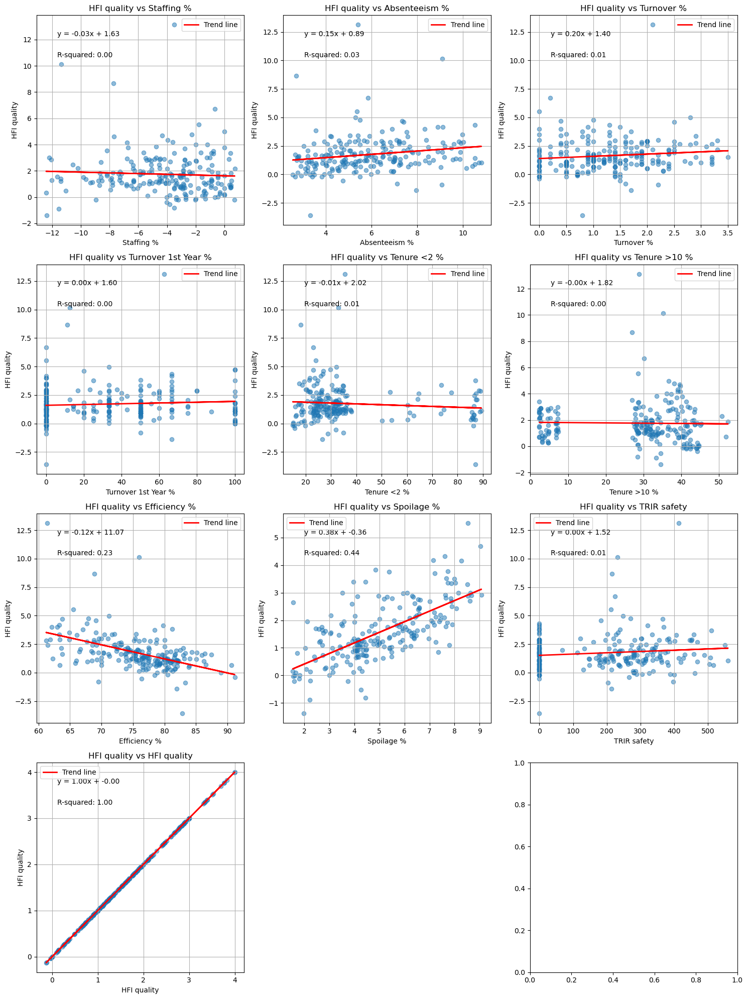

In [93]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

numeric_variables = [col for col in performance_metrics.columns if performance_metrics[col].dtype in ['int64', 'float64']]
num_plots = len(numeric_variables)
num_rows = (num_plots + 2) // 3
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

for i, var in enumerate(numeric_variables):
    row = i // 3
    col = i % 3

    lower_cutoff = performance_metrics[var].quantile(0.05)
    upper_cutoff = performance_metrics[var].quantile(0.95)
    trimmed_data = performance_metrics[(performance_metrics[var] >= lower_cutoff) & (performance_metrics[var] <= upper_cutoff)]

    x = trimmed_data[var].values.reshape(-1, 1)
    y = trimmed_data['HFI quality'].values

    model = LinearRegression()
    model.fit(x, y)
    trendline = model.predict(x)

    r_squared = r2_score(y, trendline)

    axes[row, col].scatter(trimmed_data[var], trimmed_data['HFI quality'], alpha=0.5)
    axes[row, col].plot(trimmed_data[var], trendline, color='red', linewidth=2, label='Trend line')

    equation = f'y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}'
    axes[row, col].text(0.1, 0.9, equation, transform=axes[row, col].transAxes, fontsize=10)
    axes[row, col].text(0.1, 0.8, f'R-squared: {r_squared:.2f}', transform=axes[row, col].transAxes, fontsize=10)

    axes[row, col].set_title(f"HFI quality vs {var}")
    axes[row, col].set_xlabel(var)
    axes[row, col].set_ylabel("HFI quality")
    axes[row, col].grid(True)
    axes[row, col].legend()

    if num_plots % 3 != 0 and row == num_rows - 1:
        axes[row, col + 1].axis('off')

plt.tight_layout()
plt.show()

# Trimmed the bottom and upper 5% 

C:\Users\joel3\anaconda\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
150 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
150 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\joel3\anaconda\Lib\site-packages\sklearn\pipeline.py", line 420, in fit
    self._final_estimator.fit(

Best Parameters: {'regressor__n_estimators': 100, 'regressor__min_samples_split': 2, 'regressor__min_samples_leaf': 1, 'regressor__max_features': 'log2', 'regressor__max_depth': 20}
Mean Squared Error: 3.3539020983130707
Feature Importances:
                Feature  Importance
5            Spoilage %    0.304139
2            Turnover %    0.097291
7           Tenure <2 %    0.090463
4          Tenure >10 %    0.074209
0            Staffing %    0.072004
1         Absenteeism %    0.065758
13       Plant_Plant_06    0.065326
6           TRIR safety    0.043186
3   Turnover 1st Year %    0.035318
12       Plant_Plant_05    0.032846
20       Plant_Plant_13    0.020893
11       Plant_Plant_04    0.017214
18       Plant_Plant_11    0.016951
8        Plant_Plant_01    0.011737
23       Plant_Plant_16    0.009353
21       Plant_Plant_14    0.008211
17       Plant_Plant_10    0.007525
15       Plant_Plant_08    0.007349
19       Plant_Plant_12    0.004420
10       Plant_Plant_03    0.004251
14

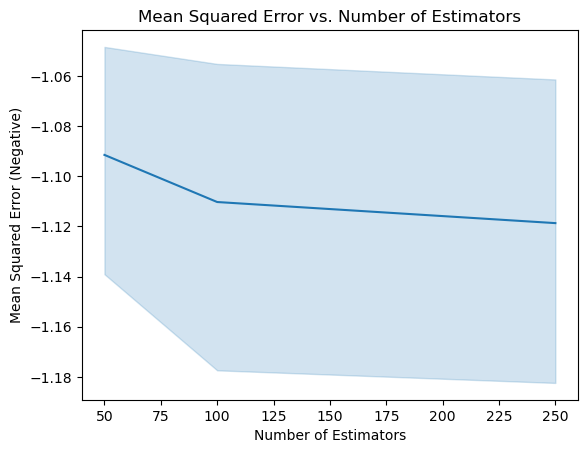

In [94]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import seaborn as sns

features = ['Plant', 'Staffing %', 'Absenteeism %', 'Turnover %',
            'Turnover 1st Year %', 'Tenure >10 %', 'Spoilage %', 'TRIR safety', 'Tenure <2 %']
X = performance_metrics[features]
y = performance_metrics['HFI quality']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

encoder = OneHotEncoder(handle_unknown='ignore')
encoder.fit(X_train[['Plant']])  

numerical_cols = ['Staffing %', 'Absenteeism %', 'Turnover %', 'Turnover 1st Year %',
                  'Tenure >10 %', 'Spoilage %', 'TRIR safety', 'Tenure <2 %']
categorical_cols = ['Plant']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols), 
        ('cat', encoder, categorical_cols)          
    ],
    remainder='passthrough'
)

rf_regressor = RandomForestRegressor()

pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', rf_regressor)])

param_dist = {
    'regressor__n_estimators': [50, 100, 250],
    'regressor__max_depth': [None, 10, 20, 30, 50, 100],
    'regressor__min_samples_split': [2, 5, 10],
    'regressor__min_samples_leaf': [1, 2, 3, 5, 10],
    'regressor__max_features': ['auto', 'sqrt', 'log2']
}

random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=100, cv=5, scoring='neg_mean_squared_error', random_state=42)
random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

importances = best_model.named_steps['regressor'].feature_importances_
feature_names = numerical_cols + list(encoder.get_feature_names_out())
feature_importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importances_df)

cv_results = pd.DataFrame(random_search.cv_results_)
sns.lineplot(x='param_regressor__n_estimators', y='mean_test_score', data=cv_results)
plt.xlabel('Number of Estimators')
plt.ylabel('Mean Squared Error (Negative)')
plt.title('Mean Squared Error vs. Number of Estimators')
plt.show()

In [95]:
single_tree = best_model.named_steps['regressor'].estimators_[0]
plt.figure(figsize=(110,150))
plot_tree(single_tree, feature_names=feature_names, filled=True, rounded=True)
plt.show()